In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import missingno as msno

### Initial Data Assessment

- There are various date columns present within the dataset.
- In some categories NaN is being represented by (null).
- CRM_ATPT_CPTD_CD : This column serves as an indicator of whethe the crime was:
    - Completed
    - Attempted
    - Failed
    - Interrupted
- LAW_CAT_CD : This column serves as an indicator of the level of offense:
    - Felony
    - Misdemeanor
    - Violation
- BORO_NM : This column serves as an indicator of the borough in which the incident occured:
    - Bronx
    - Brooklyn
    - Manhattan
    - Queens
    - Staten Island

In [2]:
data = pd.read_csv("../Data/NYPD_Complaint_Data_Historic_20231226.csv", parse_dates=[
                   'CMPLNT_FR_DT', 'CMPLNT_FR_TM', 'CMPLNT_TO_DT', 'CMPLNT_TO_TM', 'RPT_DT'], na_values=['(null)', 'nan'])

/var/folders/bc/r1pyyphx6d995_mdzms6_13c0000gn/T/ipykernel_17884/1164801633.py:1: DtypeWarning: Columns (0,18) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("../Data/NYPD_Complaint_Data_Historic_20231226.csv", parse_dates=[


In [3]:
data.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,...,SUSP_SEX,TRANSIT_DISTRICT,Latitude,Longitude,Lat_Lon,PATROL_BORO,STATION_NAME,VIC_AGE_GROUP,VIC_RACE,VIC_SEX
0,10600119,01/01/2002,2024-01-03 11:00:00,2006-02-25,2024-01-03 11:00:00,NaN,2006-03-06,104.0,RAPE,157.0,...,M,NaN,NaN,NaN,NaN,NaN,NaN,18-24,WHITE,F
1,11052575,04/22/2005,2024-01-03 02:00:00,NaT,NaT,NaN,2006-04-22,110.0,GRAND LARCENY OF MOTOR VEHICLE,441.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25-44,BLACK,M
2,10832306,07/11/2005,2024-01-03 20:00:00,2006-03-29,2024-01-03 12:00:00,NaN,2006-03-29,353.0,UNAUTHORIZED USE OF A VEHICLE,462.0,...,M,NaN,NaN,NaN,NaN,NaN,NaN,45-64,WHITE,M
3,10107192,10/19/2005,2024-01-03 20:30:00,NaT,NaT,NaN,2006-01-13,126.0,MISCELLANEOUS PENAL LAW,461.0,...,F,NaN,NaN,NaN,NaN,NaN,NaN,25-44,BLACK,F
4,23893731,12/04/2005,2024-01-03 09:00:00,2006-08-09,2024-01-03 17:00:00,NaN,2006-08-09,109.0,GRAND LARCENY,405.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25-44,WHITE,F


In [4]:
data.shape

(495206, 35)

There are ~500k rows with 35 columns.

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 495206 entries, 0 to 495205
Data columns (total 35 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   CMPLNT_NUM         495206 non-null  object        
 1   CMPLNT_FR_DT       495202 non-null  object        
 2   CMPLNT_FR_TM       495202 non-null  datetime64[ns]
 3   CMPLNT_TO_DT       321909 non-null  datetime64[ns]
 4   CMPLNT_TO_TM       323133 non-null  datetime64[ns]
 5   ADDR_PCT_CD        494819 non-null  float64       
 6   RPT_DT             495202 non-null  datetime64[ns]
 7   KY_CD              495202 non-null  float64       
 8   OFNS_DESC          491860 non-null  object        
 9   PD_CD              495199 non-null  float64       
 10  PD_DESC            495199 non-null  object        
 11  CRM_ATPT_CPTD_CD   495199 non-null  object        
 12  LAW_CAT_CD         495202 non-null  object        
 13  BORO_NM            495167 non-null  object  

In [6]:
data.isna().sum()

CMPLNT_NUM                0
CMPLNT_FR_DT              4
CMPLNT_FR_TM              4
CMPLNT_TO_DT         173297
CMPLNT_TO_TM         172073
ADDR_PCT_CD             387
RPT_DT                    4
KY_CD                     4
OFNS_DESC              3346
PD_CD                     7
PD_DESC                   7
CRM_ATPT_CPTD_CD          7
LAW_CAT_CD                4
BORO_NM                  39
LOC_OF_OCCUR_DESC    100473
PREM_TYP_DESC          6801
JURIS_DESC                4
JURISDICTION_CODE         4
PARKS_NM             495204
HADEVELOPT           493590
HOUSING_PSA          459390
X_COORD_CD              386
Y_COORD_CD              386
SUSP_AGE_GROUP       401186
SUSP_RACE            297469
SUSP_SEX             324797
TRANSIT_DISTRICT     485840
Latitude                386
Longitude               386
Lat_Lon                 386
PATROL_BORO             387
STATION_NAME         485840
VIC_AGE_GROUP        147479
VIC_RACE                  5
VIC_SEX                   5
dtype: int64

- Some columns have a disproportionate amount of missing values, upwards of a 100,000
    - Among these, a few hold valuable information such as characteristics of the suspect, these include upwards of 300000k missing values.
    - This is an important feature to analyse down the road and can't be dropped.
- The following columns have nearly all missing values and thus can be dropped.
    - PARKS_NM             495204
    - HADEVELOPT           493590
    - HOUSING_PSA          459390
    - TRANSIT_DISTRICT     485840
    - STATION_NAME         485840
- Going forward based on the question being analyzed, we may need to look at different subsets of data.

[]

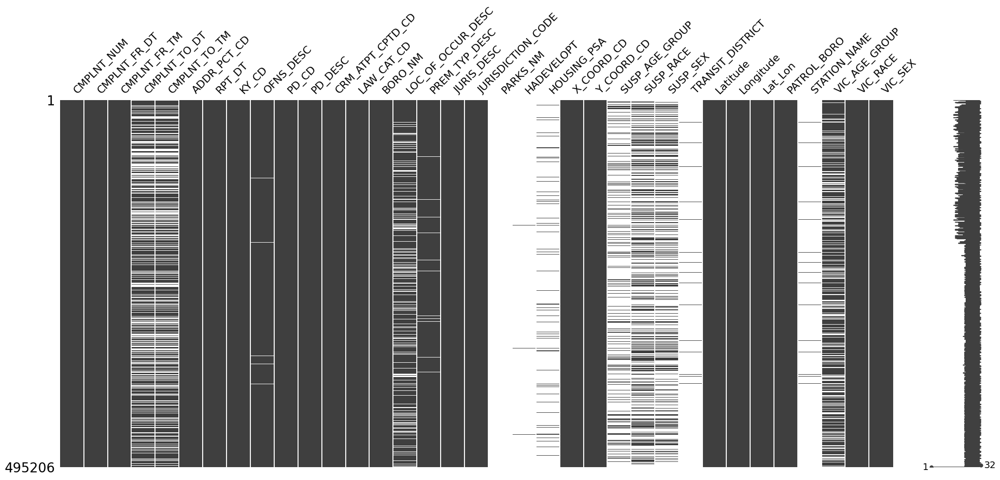

In [7]:
msno.matrix(data)
plt.plot()

- This initial plot shows that some features are displaying MNAR (Missing Not At Random) behavior as the missing values are systematically related to other unobserved values within the dataset.

In [8]:
boro_sort = data.sort_values(by='BORO_NM',ascending=True)

[]

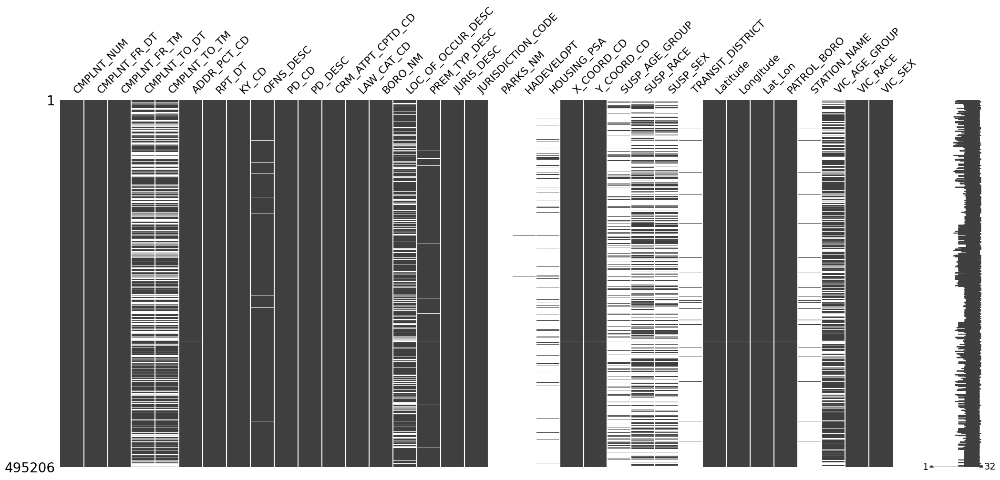

In [9]:
msno.matrix(boro_sort)
plt.plot()

In [10]:
data_v2 = data.copy(deep=True)
data_v2 = data_v2.drop(labels=['STATION_NAME', 'TRANSIT_DISTRICT', 'PARKS_NM', 'HADEVELOPT', 'HOUSING_PSA', 'KY_CD'], axis=1)

In [11]:
data_v2.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,OFNS_DESC,PD_CD,PD_DESC,...,SUSP_AGE_GROUP,SUSP_RACE,SUSP_SEX,Latitude,Longitude,Lat_Lon,PATROL_BORO,VIC_AGE_GROUP,VIC_RACE,VIC_SEX
0,10600119,01/01/2002,2024-01-03 11:00:00,2006-02-25,2024-01-03 11:00:00,NaN,2006-03-06,RAPE,157.0,RAPE 1,...,45-64,WHITE,M,NaN,NaN,NaN,NaN,18-24,WHITE,F
1,11052575,04/22/2005,2024-01-03 02:00:00,NaT,NaT,NaN,2006-04-22,GRAND LARCENY OF MOTOR VEHICLE,441.0,"LARCENY,GRAND OF AUTO",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25-44,BLACK,M
2,10832306,07/11/2005,2024-01-03 20:00:00,2006-03-29,2024-01-03 12:00:00,NaN,2006-03-29,UNAUTHORIZED USE OF A VEHICLE,462.0,UNAUTHORIZED USE VEHICLE 3,...,NaN,WHITE,M,NaN,NaN,NaN,NaN,45-64,WHITE,M
3,10107192,10/19/2005,2024-01-03 20:30:00,NaT,NaT,NaN,2006-01-13,MISCELLANEOUS PENAL LAW,461.0,UNAUTHORIZED USE VEHICLE 2,...,NaN,BLACK,F,NaN,NaN,NaN,NaN,25-44,BLACK,F
4,23893731,12/04/2005,2024-01-03 09:00:00,2006-08-09,2024-01-03 17:00:00,NaN,2006-08-09,GRAND LARCENY,405.0,"LARCENY,GRAND BY THEFT OF CREDIT CARD",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25-44,WHITE,F


In [12]:
data_v2.columns

Index(['CMPLNT_NUM', 'CMPLNT_FR_DT', 'CMPLNT_FR_TM', 'CMPLNT_TO_DT',
       'CMPLNT_TO_TM', 'ADDR_PCT_CD', 'RPT_DT', 'OFNS_DESC', 'PD_CD',
       'PD_DESC', 'CRM_ATPT_CPTD_CD', 'LAW_CAT_CD', 'BORO_NM',
       'LOC_OF_OCCUR_DESC', 'PREM_TYP_DESC', 'JURIS_DESC', 'JURISDICTION_CODE',
       'X_COORD_CD', 'Y_COORD_CD', 'SUSP_AGE_GROUP', 'SUSP_RACE', 'SUSP_SEX',
       'Latitude', 'Longitude', 'Lat_Lon', 'PATROL_BORO', 'VIC_AGE_GROUP',
       'VIC_RACE', 'VIC_SEX'],
      dtype='object')

### Simple Univariate Analysis

In this section we perform simple analysis such as viewing the unique values of the object columns to understand the data better.

In [13]:
data_v2['ADDR_PCT_CD'].nunique()

77

In [14]:
data_v2['ADDR_PCT_CD'].unique()

array([ nan,  79.,  83.,  52.,  44.,  40.,  48.,  49.,  47., 115.,  41.,
        32.,  14., 106.,  67., 122.,  46.,  75.,  71.,  42.,  50.,  73.,
        28.,  43.,  81.,  33.,  18.,   1., 120.,  84., 107.,  70.,  69.,
        24.,  66.,  13., 113., 111., 104.,  62.,   9.,  34.,  19., 110.,
        45.,  90.,  72.,  88.,  25.,  61., 100.,  30.,  94.,  68.,  10.,
       112.,  78.,  17.,  23., 108.,  26., 114., 101., 103.,  63.,   5.,
        60.,   7.,   6., 102.,  77.,  20., 105., 109.,  76., 123.,  22.,
       121.])

In [15]:
data_v2['PD_DESC'].nunique()

347

In [16]:
data_v2['LAW_CAT_CD'].value_counts()

MISDEMEANOR    267287
FELONY         163591
VIOLATION       64324
Name: LAW_CAT_CD, dtype: int64

In [17]:
data_v2['CRM_ATPT_CPTD_CD'].value_counts()

COMPLETED    487620
ATTEMPTED      7579
Name: CRM_ATPT_CPTD_CD, dtype: int64

In [18]:
data_v2['PREM_TYP_DESC'].nunique()

72

In [19]:
data_v2['PREM_TYP_DESC'].value_counts()

STREET                        163973
RESIDENCE - APT. HOUSE        100725
RESIDENCE-HOUSE                61730
RESIDENCE - PUBLIC HOUSING     32509
COMMERCIAL BUILDING            15540
                               ...  
LOAN COMPANY                      66
MOSQUE                            51
COLLEGE/UNIVERSITY                10
TRAMWAY                            2
REAL ESTATE                        1
Name: PREM_TYP_DESC, Length: 72, dtype: int64

In [20]:
data_v2['JURIS_DESC'].nunique()

23

In [21]:
data_v2['JURIS_DESC'].value_counts()

N.Y. POLICE DEPT                       442911
N.Y. HOUSING POLICE                     36642
N.Y. TRANSIT POLICE                      9769
PORT AUTHORITY                           1771
OTHER                                    1068
POLICE DEPT NYC                           930
TRI-BORO BRDG TUNNL                       766
FIRE DEPT (FIRE MARSHAL)                  472
DEPT OF CORRECTIONS                       333
HEALTH & HOSP CORP                        280
LONG ISLAND RAILRD                         44
STATN IS RAPID TRANS                       38
N.Y. STATE POLICE                          35
SEA GATE POLICE DEPT                       30
METRO NORTH                                28
N.Y. STATE PARKS                           24
U.S. PARK POLICE                           22
AMTRACK                                    17
NYC DEPT ENVIRONMENTAL PROTECTION          14
CONRAIL                                     5
NYS DEPT TAX AND FINANCE                    1
NYS DEPT ENVIRONMENTAL CONSERVATIO

In [22]:
data_v2['VIC_RACE'].value_counts()

UNKNOWN                           155510
BLACK                             120187
WHITE                              96528
WHITE HISPANIC                     81763
ASIAN / PACIFIC ISLANDER           23858
BLACK HISPANIC                     15203
AMERICAN INDIAN/ALASKAN NATIVE      2121
OTHER                                 31
Name: VIC_RACE, dtype: int64

In [23]:
data_v2['VIC_SEX'].unique()

array(['F', 'M', 'D', 'E', nan], dtype=object)

In [24]:
data_v2['SUSP_RACE'].value_counts()

BLACK                             74016
UNKNOWN                           49341
WHITE HISPANIC                    33674
WHITE                             25715
BLACK HISPANIC                     9273
ASIAN / PACIFIC ISLANDER           5031
AMERICAN INDIAN/ALASKAN NATIVE      676
OTHER                                11
Name: SUSP_RACE, dtype: int64

### Multivariate Analysis

#### Data Wrangling

In this section we will analyse the geography of related crimes. Additionally, we will also split the crimes belonging to the Queens and Brooklyn boroughs into East and West, and North and South respectively. This will help us in analysing the crime trends in these boroughs.

In [25]:
import geopandas as gpd
#import shapely
from shapely.geometry import Point, Polygon

In [26]:
ny_zones = gpd.read_file("../Data/DSNY Zones_20231227.geojson")

In [27]:
ny_zones.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [28]:
ny_zones

,fid,shape_area,zonename,globalid,shape_length,zone,geometry
0,64,0.016045528990332278,Staten Island,{B68DE9AC-215A-4FBC-A0B6-B702E40FBDB4},1.0421257823395524,SI,"MULTIPOLYGON (((-74.08221 40.64829, -74.08213 ..."
1,42,0.011627466348633526,Bronx,{B30C4556-1C1F-4CFD-B455-0F4DEC916D46},1.3993968283722906,BX,"MULTIPOLYGON (((-73.87295 40.90445, -73.87095 ..."
2,33,0.006250036157838448,Manhattan,{FD6416D5-D263-42B7-A763-C18A2CD3835F},1.0041805624646816,MN,"MULTIPOLYGON (((-73.92641 40.87763, -73.92635 ..."
3,19,0.00731500226463443,Brooklyn North,{E93CB600-7C76-43C1-9A1F-C2967E07B512},0.7000708447234278,BKN,"MULTIPOLYGON (((-73.95440 40.73912, -73.95428 ..."
4,13,0.009563286676506492,Queens West,{C571B08E-A756-4EC1-B3E7-EE9C9B4C8859},0.7413211604157702,QW,"MULTIPOLYGON (((-73.90647 40.79019, -73.90251 ..."
5,9,0.011872800568526005,Brooklyn South,{E840410B-71F7-4F62-B06E-1FDF3F9246DA},2.1824829296995265,BKS,"MULTIPOLYGON (((-74.00441 40.69254, -74.00197 ..."
6,1,0.02076054689461391,Queens East,{C84E5869-07BD-46E3-ACFC-8EB35948BCBB},2.4854123360830402,QE,"MULTIPOLYGON (((-73.83973 40.76515, -73.83970 ..."


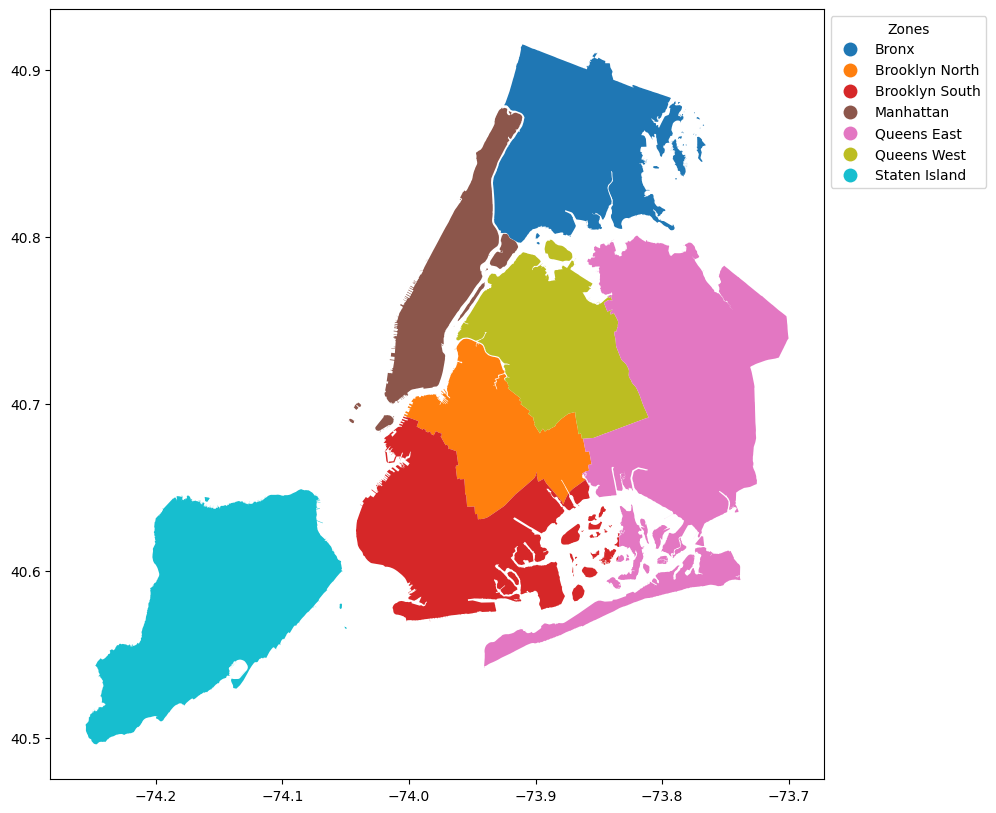

In [29]:
legend_kwds= {
    'title' : 'Zones',
    'loc' : 'upper left',
    'bbox_to_anchor' : (1,1),
    'ncol' : 1
}
ny_zones.plot(column='zonename', legend=True, legend_kwds=legend_kwds, figsize=(10,10))

plt.show()

##### Brooklyn Data

In this section we split the data according to whether the incident occurred in Brooklyn North or Brooklyn South.

In [30]:
data_v3 = data_v2.copy(deep=True)
data_v3 = data_v3.dropna(subset=['Latitude', 'Longitude'])
#check if there are any null values in latitude and longitude
data_v3['geometry'] = data_v3.apply(lambda x: Point((float(x.Longitude), float(x.Latitude))), axis=1)
data_v3 = gpd.GeoDataFrame(data_v3, crs=ny_zones.crs, geometry=data_v3['geometry'])

In [31]:
brooklyn_data = data_v3[data_v3['BORO_NM'] == 'BROOKLYN']

In [32]:
brooklyn_data.shape

(147947, 30)

In [33]:
brooklyn_data = brooklyn_data[brooklyn_data['PATROL_BORO'].str.contains('BKLYN')]
brooklyn_data.shape

(147904, 30)

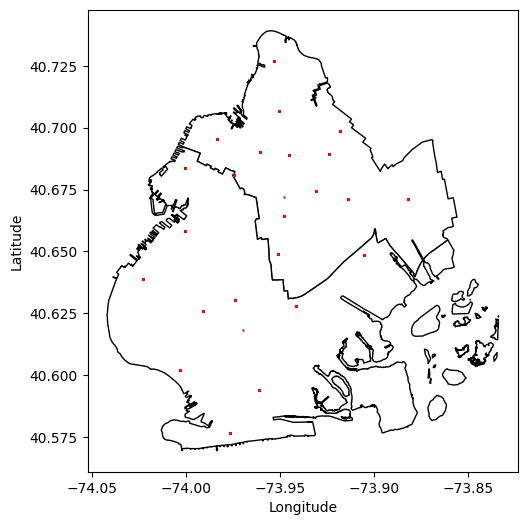

In [34]:
#plot only the brooklyn zones
brooklyn = ny_zones['zonename'].str.contains('Brooklyn')
brooklyn_zones = ny_zones[brooklyn]
brooklyn_zones.plot(color='white', edgecolor='black', figsize=(6,6))
plt.scatter(brooklyn_data['Longitude'], brooklyn_data['Latitude'], s=0.5, c='red')
#axis labels
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [35]:
bkyln_north = brooklyn_zones[brooklyn_zones['zonename'].str.contains('North')]
bkyln_south = brooklyn_zones[brooklyn_zones['zonename'].str.contains('South')]

bkyln_north_data = gpd.sjoin(brooklyn_data, bkyln_north, how='inner', predicate='within')
bkyln_south_data = gpd.sjoin(brooklyn_data, bkyln_south, how='inner', predicate='within')

bkyln_north_data['BORO_NM'] = 'BROOKLYN NORTH'
bkyln_south_data['BORO_NM'] = 'BROOKLYN SOUTH'

#merge the two dataframes
bkyln_data = pd.concat([bkyln_north_data, bkyln_south_data])

In [36]:
bkyln_data.shape

(147904, 37)

##### Queens Data

In this section we split the data according to whether the incident occurred in Queens East or Queens West.

In [37]:
queens_data = data_v3[data_v3['BORO_NM'] == 'QUEENS']

In [38]:
queens_data = queens_data.dropna(subset=['PATROL_BORO'])
queens_data = queens_data[queens_data['PATROL_BORO'].str.contains('QUEENS')]

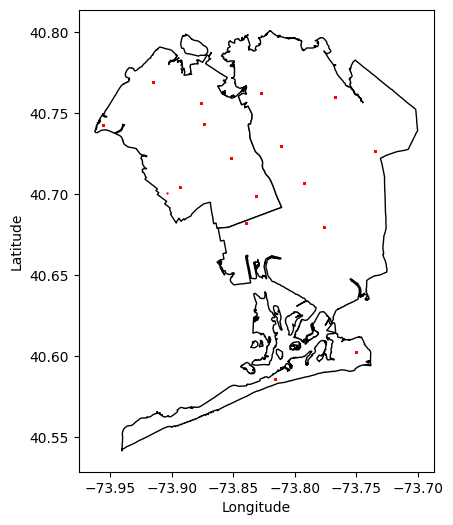

In [39]:
queens_zones = ny_zones['zonename'].str.contains('Queens')
queens_zones = ny_zones[queens_zones]
queens_zones.plot(color='white', edgecolor='black', figsize=(6,6))
plt.scatter(queens_data['Longitude'], queens_data['Latitude'], s=0.5, c='red')
#axis labels
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [40]:
queens_east = queens_zones[queens_zones['zonename'].str.contains('East')]
queens_west = queens_zones[queens_zones['zonename'].str.contains('West')]

queens_east_data = gpd.sjoin(queens_data, queens_east, how='inner', predicate='within')
queens_west_data = gpd.sjoin(queens_data, queens_west, how='inner', predicate='within')

queens_east_data['BORO_NM'] = 'QUEENS EAST'
queens_west_data['BORO_NM'] = 'QUEENS WEST'

#merge the two dataframes
queens_data = pd.concat([queens_east_data, queens_west_data])

In [41]:
queens_data.shape

(98647, 37)

In [42]:
q_and_b_data = pd.concat([queens_data, bkyln_data])

In [43]:
q_and_b_data.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,OFNS_DESC,PD_CD,PD_DESC,...,VIC_RACE,VIC_SEX,geometry,index_right,fid,shape_area,zonename,globalid,shape_length,zone
58,74774817,09/19/2010,2024-01-03 02:55:00,2010-09-19,2024-01-03 02:55:00,106.0,2010-09-24,ARSON,263.0,"ARSON 2,3,4",...,UNKNOWN,E,POINT (-73.84007 40.68240),6,1,0.02076054689461391,Queens East,{C84E5869-07BD-46E3-ACFC-8EB35948BCBB},2.4854123360830402,QE
83,210240572,02/28/2020,2024-01-03 15:15:00,NaT,NaT,106.0,2020-02-28,ASSAULT 3 & RELATED OFFENSES,101.0,ASSAULT 3,...,BLACK,M,POINT (-73.84007 40.68240),6,1,0.02076054689461391,Queens East,{C84E5869-07BD-46E3-ACFC-8EB35948BCBB},2.4854123360830402,QE
112,35291582,10/07/2004,2024-01-03 17:00:00,2007-05-07,2024-01-03 13:00:00,107.0,2007-10-25,GRAND LARCENY,438.0,"LARCENY,GRAND FROM BUILDING (NON-RESIDENCE) UN...",...,BLACK,F,POINT (-73.81091 40.73011),6,1,0.02076054689461391,Queens East,{C84E5869-07BD-46E3-ACFC-8EB35948BCBB},2.4854123360830402,QE
121,59550490,11/11/1999,2024-01-03 09:00:00,2009-03-13,2024-01-03 16:45:00,106.0,2009-03-13,THEFT-FRAUD,739.0,"FRAUD,UNCLASSIFIED-FELONY",...,WHITE HISPANIC,M,POINT (-73.84007 40.68240),6,1,0.02076054689461391,Queens East,{C84E5869-07BD-46E3-ACFC-8EB35948BCBB},2.4854123360830402,QE
131,28733076,04/28/2001,2024-01-03 21:10:00,2007-04-28,2024-01-03 21:13:00,113.0,2007-04-28,DANGEROUS WEAPONS,793.0,WEAPONS POSSESSION 3,...,UNKNOWN,E,POINT (-73.77623 40.67998),6,1,0.02076054689461391,Queens East,{C84E5869-07BD-46E3-ACFC-8EB35948BCBB},2.4854123360830402,QE


In [44]:
not_q_and_b_data = data_v3[~data_v3['BORO_NM'].isin(['QUEENS', 'BROOKLYN'])]

In [45]:
not_q_and_b_data.shape

(248209, 30)

In [46]:
q_and_b_data = q_and_b_data.iloc[:, 0:30]

In [47]:
data_v4 = pd.concat([q_and_b_data, not_q_and_b_data])
data_v4 = data_v4.sort_values(by='CMPLNT_FR_DT', ascending=True)
data_v4 = data_v4.reset_index(drop=True)

In [48]:
data_v4.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,OFNS_DESC,PD_CD,PD_DESC,...,SUSP_RACE,SUSP_SEX,Latitude,Longitude,Lat_Lon,PATROL_BORO,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,geometry
0,47950156,01/01/1948,2024-01-03 04:00:00,2008-06-28,2024-01-03 02:51:00,105.0,2008-07-02,OFF. AGNST PUB ORD SENSBLTY &,639.0,AGGRAVATED HARASSMENT 2,...,UNKNOWN,NaN,40.726529,-73.734865,"(40.7265293769835, -73.7348645378882)",PATROL BORO QUEENS SOUTH,25-44,BLACK,F,POINT (-73.73486 40.72653)
1,23317070,01/01/1964,2024-01-03 00:01:00,NaT,NaT,70.0,2006-07-07,GRAND LARCENY,405.0,"LARCENY,GRAND BY THEFT OF CREDIT CARD",...,NaN,NaN,40.630600,-73.973705,"(40.6305998504358, -73.9737053160275)",PATROL BORO BKLYN SOUTH,45-64,WHITE,M,POINT (-73.97371 40.63060)
2,78106884,01/01/1970,2024-01-03 00:01:00,1973-06-30,2024-01-03 00:01:00,122.0,2011-04-05,SEX CRIMES,168.0,SODOMY 1,...,WHITE,M,40.574286,-74.105914,"(40.5742856881925, -74.1059144051212)",PATROL BORO STATEN ISLAND,45-64,WHITE,M,POINT (-74.10591 40.57429)
3,94121599,01/01/1971,2024-01-03 00:01:00,NaT,NaT,77.0,2013-12-19,SEX CRIMES,175.0,"SEXUAL ABUSE 3,2",...,NaN,NaN,40.674496,-73.930571,"(40.6744956865259, -73.9305713255961)",PATROL BORO BKLYN NORTH,45-64,WHITE,F,POINT (-73.93057 40.67450)
4,87799187,01/01/1972,2024-01-03 00:01:00,1972-01-02,2024-01-03 23:59:00,25.0,2012-11-21,SEX CRIMES,175.0,"SEXUAL ABUSE 3,2",...,WHITE,M,40.800930,-73.941098,"(40.8009303727402, -73.9410982410066)",PATROL BORO MAN NORTH,45-64,WHITE,F,POINT (-73.94110 40.80093)


#### Geography Analysis

##### Crime Analysis

In [49]:
borough_counts = data_v4['BORO_NM'].value_counts()
borough_counts = borough_counts.reset_index()
borough_counts.columns = ['BORO_NM', 'COUNT']
borough_counts

,BORO_NM,COUNT
0,MANHATTAN,119057
1,BRONX,103809
2,BROOKLYN NORTH,85636
3,BROOKLYN SOUTH,62268
4,QUEENS EAST,52774
5,QUEENS WEST,45873
6,STATEN ISLAND,25308


In [52]:
fig = px.bar(borough_counts, x='BORO_NM', y='COUNT', color='COUNT', title='Number of Crimes in Each Borough', color_continuous_scale='RdBu_r')
fig.update_layout(xaxis_title='Borough', yaxis_title='Number of Crimes')
fig.show()

The borough of Manhattan has reported the highest number of crimes with Bronx coming in second place.

In [63]:
crime_count_by_cat = data_v4.groupby(['BORO_NM', 'LAW_CAT_CD']).size().reset_index(name='COUNT')
#bar chart
fig = px.bar(crime_count_by_cat, x='BORO_NM', y='COUNT', color='LAW_CAT_CD',barmode='group',title='Number of Crimes in Each Borough by Category')
fig.update_layout(xaxis_title='Borough', yaxis_title='Number of Crimes')
fig.show()

In [229]:
# do for OFNS_DESC
crime_details = data_v4['OFNS_DESC'].value_counts()
crime_details = crime_details.reset_index()
crime_details.columns = ['OFNS_DESC', 'COUNT']
selected_crimes = crime_details[crime_details['COUNT'] > 10000]['OFNS_DESC']

In [230]:
crime_details

,OFNS_DESC,COUNT
0,PETIT LARCENY,73932
1,HARRASSMENT 2,63511
2,CRIMINAL MISCHIEF & RELATED OF,48305
3,ASSAULT 3 & RELATED OFFENSES,47324
4,GRAND LARCENY,45175
5,OFF. AGNST PUB ORD SENSBLTY &,32154
6,DANGEROUS DRUGS,30408
7,BURGLARY,20714
8,ROBBERY,20448
9,FELONY ASSAULT,15571


In [231]:
crime_subset = data_v4[data_v4['OFNS_DESC'].isin(selected_crimes)]

In [232]:
# Custom color scale with colors similar to tab20
custom_colors_tab30 = [
    '#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c', '#98df8a', '#d62728', '#ff9896',
    '#9467bd', '#c5b0d5', '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f', '#c7c7c7',
    '#bcbd22', '#dbdb8d', '#17becf', '#9edae5', '#FF5733', '#900C3F', '#DAF7A6', '#C70039',
    '#FFC300', '#581845', '#4B0082', '#FFD700', '#7FFF00', '#D2691E'
]

crime_detailed_group = crime_subset.groupby(['BORO_NM', 'OFNS_DESC']).size().reset_index(name='COUNT')

#bar chart
fig = px.bar(
    crime_detailed_group, 
    x='BORO_NM', 
    y='COUNT', 
    color='OFNS_DESC',
    title='Number of Crimes in Each Borough by Category',
    color_discrete_sequence=custom_colors_tab30)
fig.update_layout(xaxis_title='Borough', yaxis_title='Number of Crimes')
fig.show()

In [233]:
#pivot crime_detailed_group
crime_detailed_group_pivot = crime_detailed_group.pivot(index='BORO_NM', columns='OFNS_DESC', values='COUNT')
crime_detailed_group_pivot = crime_detailed_group_pivot.fillna(0)
crime_detailed_group_pivot

OFNS_DESC,ASSAULT 3 & RELATED OFFENSES,BURGLARY,CRIMINAL MISCHIEF & RELATED OF,DANGEROUS DRUGS,FELONY ASSAULT,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,HARRASSMENT 2,OFF. AGNST PUB ORD SENSBLTY &,PETIT LARCENY,ROBBERY
BORO_NM,,,,,,,,,,,
BRONX,10722,3504,9692,11189,3968,5342,3098,14151,6905,12496,4258
BROOKLYN NORTH,9885,3809,8156,7195,3744,5732,2448,10301,5165,10791,4517
BROOKLYN SOUTH,5950,3053,6623,2359,1709,6148,2125,8589,4504,9478,2614
MANHATTAN,9045,4522,8311,6776,3054,17950,1545,12642,6775,22502,4412
QUEENS EAST,5106,2709,6540,1159,1488,4441,2280,7293,3624,7504,2220
QUEENS WEST,4360,2505,4695,779,1228,4396,2121,5704,2920,7604,2031
STATEN ISLAND,2255,612,4287,950,377,1162,576,4830,2261,3554,393


In [234]:
#heatmap using the pivot
crime_detailed_group_pivot = crime_detailed_group_pivot.T
fig = px.imshow(crime_detailed_group_pivot, color_continuous_scale='Reds')
#title and axis and x-axis rotation
fig.update_layout(title='Heatmap of Crimes in Each Borough', xaxis_title='Borough', yaxis_title='Crime Category', xaxis_tickangle=-45)
fig.show()

##### Statistical Test
Comparing which Borough is more dangerous, Bronx or Manhattan?

In [217]:
crime_detailed_group_pivot[['BRONX', 'MANHATTAN']]

BORO_NM,BRONX,MANHATTAN
OFNS_DESC,,
ASSAULT 3 & RELATED OFFENSES,10722,9045
BURGLARY,3504,4522
CRIMINAL MISCHIEF & RELATED OF,9692,8311
DANGEROUS DRUGS,11189,6776
FELONY ASSAULT,3968,3054
GRAND LARCENY,5342,17950
GRAND LARCENY OF MOTOR VEHICLE,3098,1545
HARRASSMENT 2,14151,12642
OFF. AGNST PUB ORD SENSBLTY &,6905,6775


In [218]:
violent_crimes = ['HARRASSMENT 2', 
'DANGEROUS DRUGS', 
'CRIMINAL MISCHIEF & RELATED OF', 
'FELONY ASSAULT', 
'ASSAULT 3 & RELATED OFFENSES',
'BURGLARY',
'ROBBERY',
'DANGEROUS WEAPONS',
'SEX CRIMES',
'RAPE',
'ARSON']
violent_crimes_pivot = crime_detailed_group_pivot[crime_detailed_group_pivot.index.isin(violent_crimes)][['BRONX', 'MANHATTAN']]
print(f'Violent Crimes in Bronx {violent_crimes_pivot["BRONX"].sum()}')
print(f'Violent Crimes in Manhattan {violent_crimes_pivot["MANHATTAN"].sum()}')
violent_crimes_pivot

Violent Crimes in Bronx 57484
Violent Crimes in Manhattan 48762


BORO_NM,BRONX,MANHATTAN
OFNS_DESC,,
ASSAULT 3 & RELATED OFFENSES,10722,9045
BURGLARY,3504,4522
CRIMINAL MISCHIEF & RELATED OF,9692,8311
DANGEROUS DRUGS,11189,6776
FELONY ASSAULT,3968,3054
HARRASSMENT 2,14151,12642
ROBBERY,4258,4412


Null Hypothesis: The number of violent crimes reported in Bronx is no higher than the number of violent crimes reported in Manhattan.

In [219]:
import dc_stat_think as dcst

In [220]:
def diff_of_sum(data_1, data_2):
    return np.abs(np.sum(data_1) - np.sum(data_2))

crime_counts = np.concatenate([violent_crimes_pivot['BRONX'].values, violent_crimes_pivot['MANHATTAN'].values])
perm_reps = dcst.draw_perm_reps(crime_counts[:5], crime_counts[5:], diff_of_sum, size=100000)

In [222]:
og_diff = diff_of_sum(crime_counts[:7], crime_counts[7:])
og_diff

8722

In [223]:
p = np.sum(perm_reps >= og_diff) / len(perm_reps)
print(f'p-value = {p}')

p-value = 0.94508


The p-value is much higher than the significance level of 0.05, thus we fail to reject the null hypothesis. This means that there is no significant difference between the number of violent crimes reported in Bronx and Manhattan.

In [224]:
crime_counts

array([10722,  3504,  9692, 11189,  3968, 14151,  4258,  9045,  4522,
        8311,  6776,  3054, 12642,  4412])

In [225]:
bx_mh = crime_subset[crime_subset['BORO_NM'].isin(['BRONX', 'MANHATTAN'])]
bx_mh = bx_mh[['BORO_NM', 'OFNS_DESC', 'ADDR_PCT_CD']]
# check if any police precincts in bronx and manhattan are the same
print(bx_mh['ADDR_PCT_CD'].nunique())
print(bx_mh[bx_mh['BORO_NM'] == 'BRONX']['ADDR_PCT_CD'].nunique())
print(bx_mh[bx_mh['BORO_NM'] == 'MANHATTAN']['ADDR_PCT_CD'].nunique())

57
28
37


In [226]:
bx_mh_vcrimes = bx_mh[bx_mh['OFNS_DESC'].isin(violent_crimes)]
bx_mh_vcrimes_by_prcnt = bx_mh_vcrimes.groupby(['BORO_NM', 'ADDR_PCT_CD']).size().reset_index(name='COUNT')
#get bronx sum
bx_vcrimes_sum = bx_mh_vcrimes_by_prcnt[bx_mh_vcrimes_by_prcnt['BORO_NM'] == 'BRONX']['COUNT'].sum()
#get manhattan sum
mh_vcrimes_sum = bx_mh_vcrimes_by_prcnt[bx_mh_vcrimes_by_prcnt['BORO_NM'] == 'MANHATTAN']['COUNT'].sum()
#print nicely
print(f'Violent Crimes in Bronx {bx_vcrimes_sum}')
print(f'Violent Crimes in Manhattan {mh_vcrimes_sum}')

Violent Crimes in Bronx 57484
Violent Crimes in Manhattan 48762


In [227]:
bx_mh_vcrimes_by_prcnt_counts = bx_mh_vcrimes_by_prcnt['COUNT']
perm_reps = dcst.draw_perm_reps(bx_mh_vcrimes_by_prcnt_counts[:19], bx_mh_vcrimes_by_prcnt_counts[19:], diff_of_sum, size=10000)
og_diff = diff_of_sum(bx_mh_vcrimes_by_prcnt_counts[:19], bx_mh_vcrimes_by_prcnt_counts[19:])
print('Observed Difference: ', og_diff)
p = np.sum(perm_reps >= og_diff) / len(perm_reps)
print(f'p-value = {p}')

Observed Difference:  8716
p-value = 0.9542


This test shows the same result, Bronx and Manhattan are not significantly different in terms of the number of violent crimes reported.

##### Joining the Polygons

Brooklyn and Queens have been split into two parts each, North and South for Brooklyn and East and West for Queens, we have population only for the entire boroughs however. Thus we need to join the polygons for each borough.

In [248]:
from shapely.geometry import MultiPolygon

In [228]:
ny_zones

,fid,shape_area,zonename,globalid,shape_length,zone,geometry
0,64,0.016045528990332278,Staten Island,{B68DE9AC-215A-4FBC-A0B6-B702E40FBDB4},1.0421257823395524,SI,"MULTIPOLYGON (((-74.08221 40.64829, -74.08213 ..."
1,42,0.011627466348633526,Bronx,{B30C4556-1C1F-4CFD-B455-0F4DEC916D46},1.3993968283722906,BX,"MULTIPOLYGON (((-73.87295 40.90445, -73.87095 ..."
2,33,0.006250036157838448,Manhattan,{FD6416D5-D263-42B7-A763-C18A2CD3835F},1.0041805624646816,MN,"MULTIPOLYGON (((-73.92641 40.87763, -73.92635 ..."
3,19,0.00731500226463443,Brooklyn North,{E93CB600-7C76-43C1-9A1F-C2967E07B512},0.7000708447234278,BKN,"MULTIPOLYGON (((-73.95440 40.73912, -73.95428 ..."
4,13,0.009563286676506492,Queens West,{C571B08E-A756-4EC1-B3E7-EE9C9B4C8859},0.7413211604157702,QW,"MULTIPOLYGON (((-73.90647 40.79019, -73.90251 ..."
5,9,0.011872800568526005,Brooklyn South,{E840410B-71F7-4F62-B06E-1FDF3F9246DA},2.1824829296995265,BKS,"MULTIPOLYGON (((-74.00441 40.69254, -74.00197 ..."
6,1,0.02076054689461391,Queens East,{C84E5869-07BD-46E3-ACFC-8EB35948BCBB},2.4854123360830402,QE,"MULTIPOLYGON (((-73.83973 40.76515, -73.83970 ..."


In [243]:
data_v5 = data_v4.copy()
data_v5 = data_v5.dropna(subset=['BORO_NM'])

In [244]:
data_v5['BORO_NM'].unique()

array(['QUEENS EAST', 'BROOKLYN SOUTH', 'STATEN ISLAND', 'BROOKLYN NORTH',
       'MANHATTAN', 'QUEENS WEST', 'BRONX'], dtype=object)

In [328]:
#combine brooklyn north and south
data_v5['BORO_NM'] = data_v5['BORO_NM'].replace(['BROOKLYN NORTH', 'BROOKLYN SOUTH'], 'BROOKLYN')
#combine in one line
data_v5['BORO_NM'] = data_v5['BORO_NM'].replace(['QUEENS EAST', 'QUEENS WEST'], 'QUEENS')

In [376]:
ny_zones_combined = ny_zones.copy()
ny_zones_combined = ny_zones_combined[['zonename', 'geometry']]
no_bkyln = ny_zones_combined[~ny_zones_combined['zonename'].str.contains('Brooklyn')]
north_bkyln_geo = ny_zones_combined[ny_zones_combined['zonename'] == 'Brooklyn North']['geometry'].values[0]
south_bklyn_geo = ny_zones_combined[ny_zones_combined['zonename'] == 'Brooklyn South']['geometry'].values[0]
bkyln_geo = north_bkyln_geo.union(south_bklyn_geo)
no_bkyln = pd.concat([no_bkyln, pd.DataFrame({'zonename': ['Brooklyn'], 'geometry': [bkyln_geo]})])

In [377]:
#do same with queens east and west
no_queens = no_bkyln[~no_bkyln['zonename'].str.contains('Queens')]
east_queens_geo = ny_zones_combined[ny_zones_combined['zonename'] == 'Queens East']['geometry'].values[0]
west_queens_geo = ny_zones_combined[ny_zones_combined['zonename'] == 'Queens West']['geometry'].values[0]
queens_geo = east_queens_geo.union(west_queens_geo)
no_queens = pd.concat([no_queens, pd.DataFrame({'zonename': ['Queens'], 'geometry': [queens_geo]})])
five_boroughs = no_queens.copy()

##### Choropleth

In [379]:
five_boroughs['zone'] = ['SI', 'BX', 'MN', 'BK', 'QN']

In [380]:
five_boroughs


,zonename,geometry,zone
0,Staten Island,"MULTIPOLYGON (((-74.08221 40.64829, -74.08213 ...",SI
1,Bronx,"MULTIPOLYGON (((-73.87295 40.90445, -73.87095 ...",BX
2,Manhattan,"MULTIPOLYGON (((-73.92641 40.87763, -73.92635 ...",MN
0,Brooklyn,"MULTIPOLYGON (((-73.95428 40.73912, -73.95423 ...",BK
0,Queens,"MULTIPOLYGON (((-73.83958 40.76526, -73.83946 ...",QN


In [381]:
population_map = {
    'Staten Island' : 487155,
    'Queens' : 2330295,
    'Manhattan' : 1676720,
    'Brooklyn' : 2754009,
    'Bronx' : 1518998
}

five_boroughs = five_boroughs.reset_index(drop=True)
five_boroughs['population'] = five_boroughs['zonename'].map(population_map)
five_boroughs

,zonename,geometry,zone,population
0,Staten Island,"MULTIPOLYGON (((-74.08221 40.64829, -74.08213 ...",SI,487155
1,Bronx,"MULTIPOLYGON (((-73.87295 40.90445, -73.87095 ...",BX,1518998
2,Manhattan,"MULTIPOLYGON (((-73.92641 40.87763, -73.92635 ...",MN,1676720
3,Brooklyn,"MULTIPOLYGON (((-73.95428 40.73912, -73.95423 ...",BK,2754009
4,Queens,"MULTIPOLYGON (((-73.83958 40.76526, -73.83946 ...",QN,2330295


In [382]:
crimes_by_boro = data_v5['BORO_NM'].value_counts()
crimes_by_boro = crimes_by_boro.reset_index()
crimes_by_boro.columns = ['zonename', 'count']
#make borough names title form
crimes_by_boro['zonename'] = crimes_by_boro['zonename'].str.title()

In [383]:
crimes_by_boro

,zonename,count
0,Brooklyn,147904
1,Manhattan,119057
2,Bronx,103809
3,Queens,98647
4,Staten Island,25308


In [420]:
crime_geodf = five_boroughs.merge(crimes_by_boro, on='zonename')
crime_geodf = crime_geodf.rename(columns={'count': 'crime_count'})
crime_geodf['crimes_per_1000'] = crime_geodf['crime_count'] / crime_geodf['population'] * 1000
crime_geodf['centres'] = crime_geodf['geometry'].centroid
crime_geodf

,zonename,geometry,zone,population,crime_count,crimes_per_1000,centres
0,Staten Island,"MULTIPOLYGON (((-74.08221 40.64829, -74.08213 ...",SI,487155,25308,51.950611,POINT (-74.15337 40.58087)
1,Bronx,"MULTIPOLYGON (((-73.87295 40.90445, -73.87095 ...",BX,1518998,103809,68.340445,POINT (-73.86640 40.85365)
2,Manhattan,"MULTIPOLYGON (((-73.92641 40.87763, -73.92635 ...",MN,1676720,119057,71.005892,POINT (-73.96732 40.77710)
3,Brooklyn,"MULTIPOLYGON (((-73.95428 40.73912, -73.95423 ...",BK,2754009,147904,53.704981,POINT (-73.94775 40.64481)
4,Queens,"MULTIPOLYGON (((-73.83958 40.76526, -73.83946 ...",QN,2330295,98647,42.332409,POINT (-73.81888 40.70811)


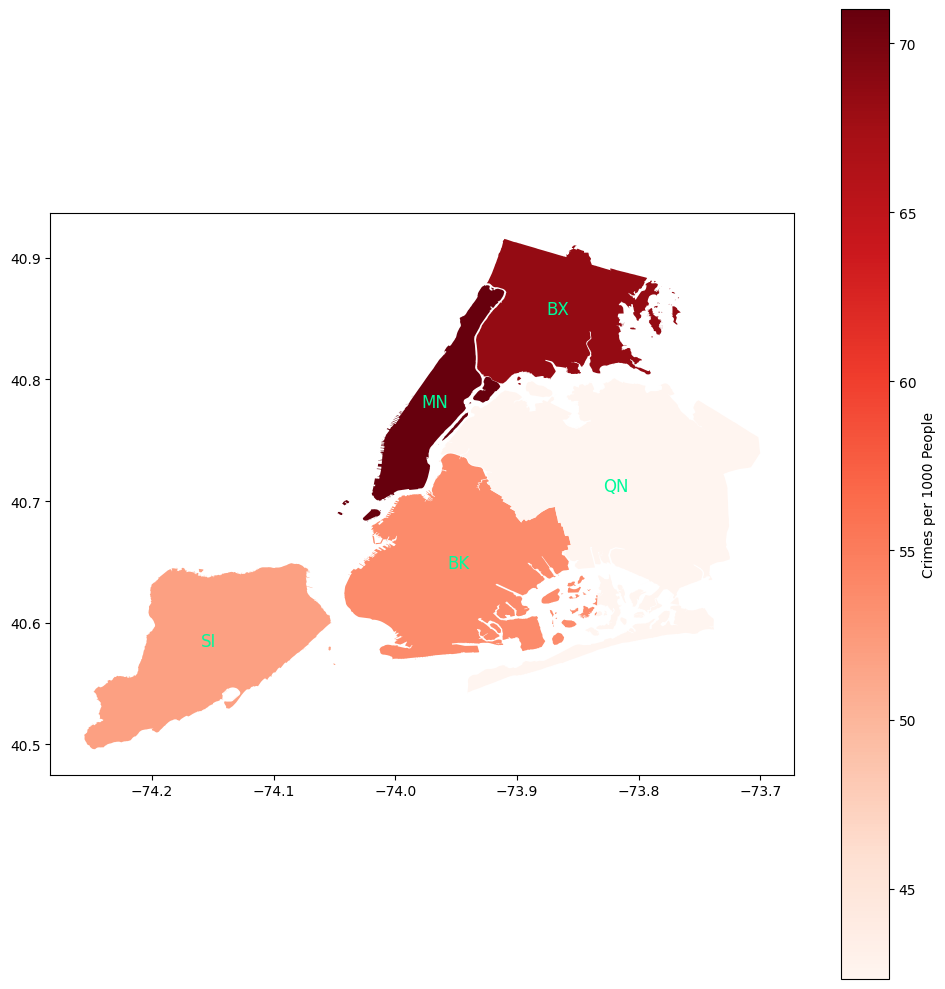

In [421]:
#choropleth map using geopandas
crime_geodf.plot(
    column='crimes_per_1000', 
    legend=True, 
    legend_kwds={'label': 'Crimes per 1000 People'}, 
    figsize=(10,10),
    cmap='Reds')
#add borough short names
for idx, row in crime_geodf.iterrows():
    plt.annotate(
        xy=row['centres'].coords[0], 
        horizontalalignment='center', 
        text=row['zone'], 
        fontsize=12,
        color='mediumspringgreen')

plt.tight_layout()
plt.show()

In [422]:
#drop centres column
crime_geodf = crime_geodf.drop('centres', axis=1)
#turn crime_geodf into a geojson dict
crime_geodf_dict = crime_geodf.__geo_interface__

In [423]:
fig = px.choropleth(
    crime_geodf,
    geojson=crime_geodf_dict,
    locations='zonename',
    featureidkey='properties.zonename',
    color='crimes_per_1000',
    color_continuous_scale='Reds',
    hover_name='zonename',
    hover_data=['crime_count', 'population'],
    title='Crimes per 1000 People in Each Borough',
)
fig.update_geos(fitbounds='locations', visible=False)
#add borough short names on the face
fig.add_trace(go.Scattergeo(
    lon=crime_geodf['geometry'].centroid.x,
    lat=crime_geodf['geometry'].centroid.y,
    text=crime_geodf['zone'],
    mode='text',
    textfont=dict(
        size=10,
        color='mediumspringgreen'
    )
))
fig.show()

In [424]:
violent_crime_subset = data_v5[data_v5['OFNS_DESC'].isin(violent_crimes)]
violent_crime_borough_count = violent_crime_subset['BORO_NM'].value_counts()
violent_crime_borough_count = violent_crime_borough_count.reset_index()
violent_crime_borough_count.columns = ['zonename', 'count']
violent_crime_borough_count['zonename'] = violent_crime_borough_count['zonename'].str.title()
violent_crime_borough_count

,zonename,count
0,Brooklyn,84886
1,Bronx,62299
2,Manhattan,52743
3,Queens,52105
4,Staten Island,14547


In [425]:
#add v_crime_count to crime_geodf
crime_geodf = crime_geodf.merge(violent_crime_borough_count, on='zonename')
crime_geodf = crime_geodf.rename(columns={'count': 'v_crime_count'})
crime_geodf['v_crimes_per_1000'] = crime_geodf['v_crime_count'] / crime_geodf['population'] * 1000
crime_geodf

,zonename,geometry,zone,population,crime_count,crimes_per_1000,v_crime_count,v_crimes_per_1000
0,Staten Island,"MULTIPOLYGON (((-74.08221 40.64829, -74.08213 ...",SI,487155,25308,51.950611,14547,29.861132
1,Bronx,"MULTIPOLYGON (((-73.87295 40.90445, -73.87095 ...",BX,1518998,103809,68.340445,62299,41.013221
2,Manhattan,"MULTIPOLYGON (((-73.92641 40.87763, -73.92635 ...",MN,1676720,119057,71.005892,52743,31.456057
3,Brooklyn,"MULTIPOLYGON (((-73.95428 40.73912, -73.95423 ...",BK,2754009,147904,53.704981,84886,30.822702
4,Queens,"MULTIPOLYGON (((-73.83958 40.76526, -73.83946 ...",QN,2330295,98647,42.332409,52105,22.359830


In [428]:
crime_geodf_v = crime_geodf.copy()
#add centres to this
crime_geodf_v['centres'] = crime_geodf_v['geometry'].centroid

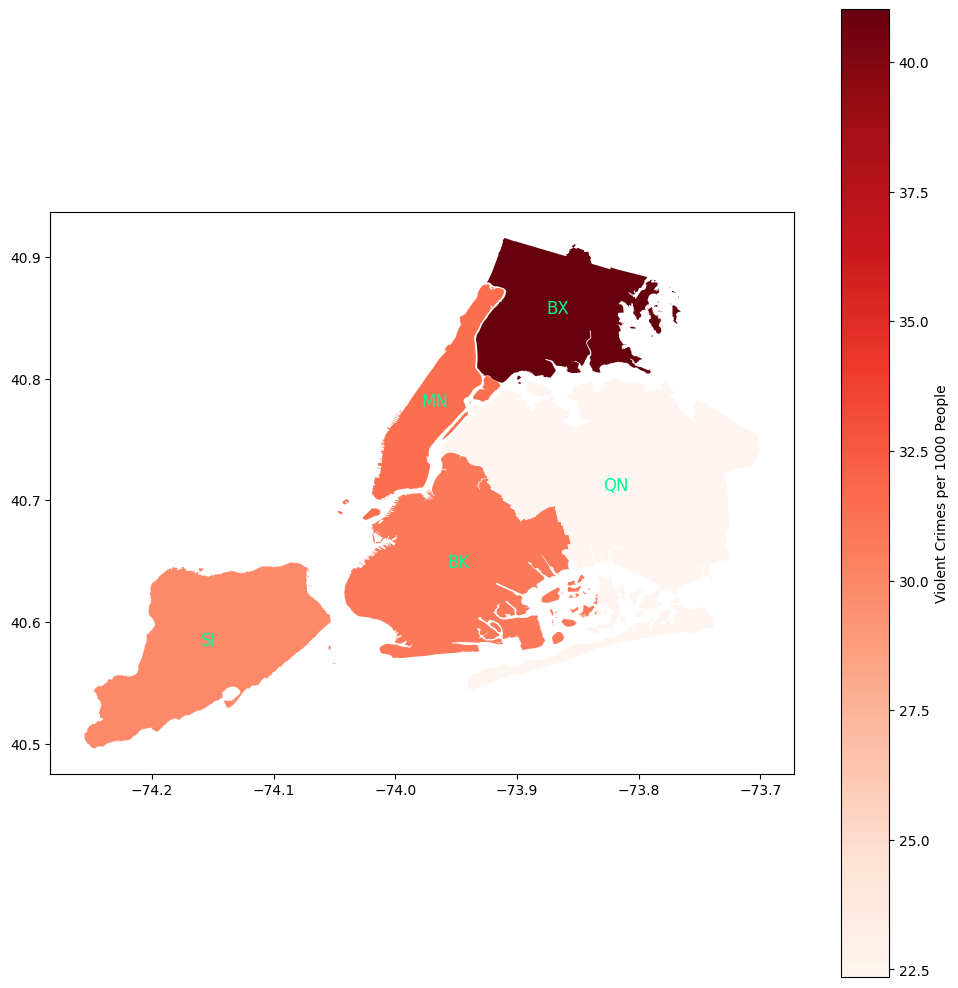

In [429]:
#geopandas choropleth of violent crimes
crime_geodf_v.plot(
    column='v_crimes_per_1000', 
    legend=True, 
    legend_kwds={'label': 'Violent Crimes per 1000 People'}, 
    figsize=(10,10),
    cmap='Reds')

#add borough short names
for idx, row in crime_geodf_v.iterrows():
    plt.annotate(
        xy=row['centres'].coords[0], 
        horizontalalignment='center', 
        text=row['zone'], 
        fontsize=12,
        color='mediumspringgreen')

plt.tight_layout()
plt.show()

In [433]:
#choropleth plotly, drop centres column
crime_geodf_v = crime_geodf_v.drop('centres', axis=1)
#turn crime_geodf into a geojson dict
crime_geodf_dict = crime_geodf_v.__geo_interface__

In [434]:
#choropleth plotly
fig = px.choropleth(
    crime_geodf,
    geojson=crime_geodf_dict,
    locations='zonename',
    featureidkey='properties.zonename',
    color='v_crimes_per_1000',
    color_continuous_scale='Reds',
    hover_name='zonename',
    hover_data=['v_crime_count', 'population'],
    title='Violent Crimes per 1000 People in Each Borough',
)

fig.update_geos(fitbounds='locations', visible=False)
#add borough short names on the face
fig.add_trace(go.Scattergeo(
    lon=crime_geodf['geometry'].centroid.x,
    lat=crime_geodf['geometry'].centroid.y,
    text=crime_geodf['zone'],
    mode='text',
    textfont=dict(
        size=10,
        color='mediumspringgreen'
    )
))

fig.show()

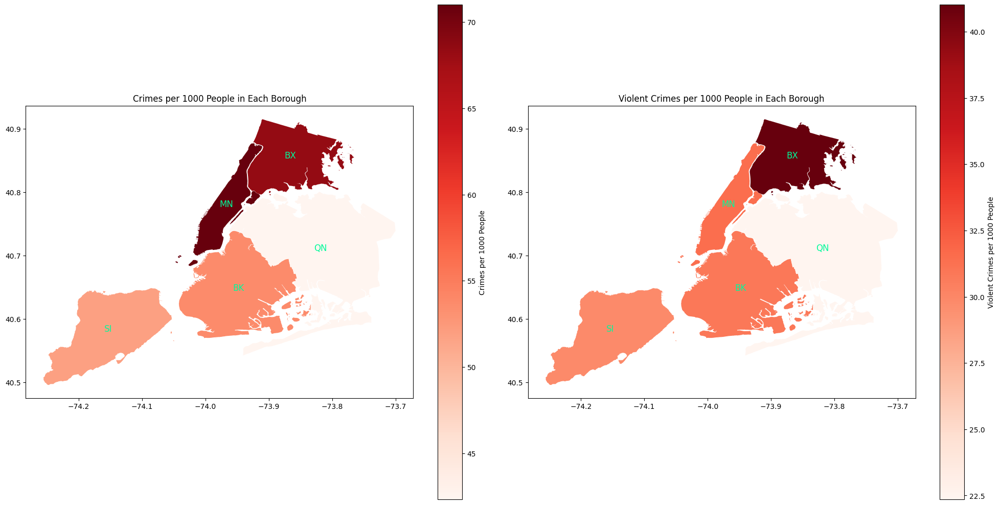

In [431]:
#side by side geopandas choropleth, crimes vs violent crimes
fig, ax = plt.subplots(1, 2, figsize=(20,10))
crime_geodf_v.plot(
    column='crimes_per_1000', 
    legend=True, 
    legend_kwds={'label': 'Crimes per 1000 People'}, 
    cmap='Reds',
    ax=ax[0])

#add borough short names
for idx, row in crime_geodf_v.iterrows():
    ax[0].annotate(
        xy=row['centres'].coords[0], 
        horizontalalignment='center', 
        text=row['zone'], 
        fontsize=12,
        color='mediumspringgreen')

ax[0].set_title('Crimes per 1000 People in Each Borough')

crime_geodf_v.plot(
    column='v_crimes_per_1000', 
    legend=True, 
    legend_kwds={'label': 'Violent Crimes per 1000 People'}, 
    cmap='Reds',
    ax=ax[1]) 

#add borough short names
for idx, row in crime_geodf_v.iterrows():
    ax[1].annotate(
        xy=row['centres'].coords[0], 
        horizontalalignment='center', 
        text=row['zone'], 
        fontsize=12,
        color='mediumspringgreen')

ax[1].set_title('Violent Crimes per 1000 People in Each Borough')

plt.tight_layout()
plt.show()

#### Time Analysis